In [23]:
import os
import sys
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as cpl
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cmx
from matplotlib.collections import LineCollection
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
import matplotlib.patches as patches
import skfuzzy as fuzz
from skfuzzy import control as ctrl

from IPython.display import HTML

%matplotlib inline

In [24]:
FRAMERATE = 15
DATA_FILE = 'data/data.csv'

In [25]:
df = pd.read_csv(DATA_FILE, skiprows=1, names=['gpstime', 'devicetime', 'longitude',
    'latitude', 'gpsspeed', 'horzdilprec', 'alt', 'bearing', 'gx', 'gy', 'gz', 'gc',
    'absthrottlepos', 'accsensor', 'accpedalposd', 'accpedalpose', 'airfuelratio',
    'avgtripspeed', 'drivetorquedemand', 'ambientairtemp', 'enginekw', 'engineload',
    'absengineload', 'enginerpm', 'vapourpressure', 'fuelhourrate', 'fuelminuterate',
    'fuelpressure', 'fuelrate', 'fueltrimbank1sensor', 'fueltrimbank1shortterm',
    'gpsaccuracy', 'gpslatitude', 'gpslongitude', 'gpsobdspeeddiff', 'hp', 'intakepressure',
    'instantfuel', 'lp100klongterm', 'airflowrate', 'speedgps', 'speedobd', 'throttleposition',
    'timingadvance', 'torque', 'triptimemoving', 'triptimestationary', 'turboboost',
    'volumetric efficiency'])
df = df[df.speedobd > 0]

In [26]:
class aggFuzzyLogic:
    def __init__(self):
        x_velocity = np.arange(0, 100.1, 0.1)
        x_throttle = np.arange(0, 1.01, 0.01)
        x_aggressiveness  = np.arange(-4, 5, 1)

        # Generate fuzzy membership functions
        vel_lo = fuzz.trimf(x_velocity, [0, 0, 40])
        vel_md = fuzz.trimf(x_velocity, [15, 50, 85])
        vel_hi = fuzz.trimf(x_velocity, [60, 100, 100])
        throttle_lo = fuzz.trimf(x_throttle, [0, 0, 0.4])
        throttle_md = fuzz.trimf(x_throttle, [0.2, 0.5, 0.8])
        throttle_hi = fuzz.trimf(x_throttle, [0.6, 1.0, 1.0])
        aggressive_LN = fuzz.trimf(x_aggressiveness, [-4, -4, -2])
        aggressive_N = fuzz.trimf(x_aggressiveness, [-3, -2, -1])
        aggressive_M = fuzz.trimf(x_aggressiveness, [-2, 0, 2 ])
        aggressive_A = fuzz.trimf(x_aggressiveness, [1, 2, 3])
        aggressive_HA = fuzz.trimf(x_aggressiveness, [2, 3, 4])
        velocity = ctrl.Antecedent(x_velocity, 'velocity')
        throttle = ctrl.Antecedent(x_throttle, 'throttle')
        aggressiveness = ctrl.Consequent(x_aggressiveness, 'aggressiveness')
        velocity.automf(names=['L', 'M', 'H'])
        throttle.automf(names=['L', 'M', 'H'])
        aggressiveness.automf(names=['LN', 'N', 'M', 'A', 'HA'])

        rule1 = ctrl.Rule(velocity['L'] & throttle['L'], aggressiveness['LN'])
        rule2 = ctrl.Rule(velocity['L'] & throttle['M'], aggressiveness['M'])
        rule3 = ctrl.Rule(velocity['L'] & throttle['H'], aggressiveness['HA'])
        rule4 = ctrl.Rule(velocity['M'] & throttle['L'], aggressiveness['N'])
        rule5 = ctrl.Rule(velocity['M'] & throttle['M'], aggressiveness['M'])
        rule6 = ctrl.Rule(velocity['M'] & throttle['H'], aggressiveness['A'])
        rule7 = ctrl.Rule(velocity['H'] & throttle['L'], aggressiveness['HA'])
        rule8 = ctrl.Rule(velocity['H'] & throttle['M'], aggressiveness['A'])
        rule9 = ctrl.Rule(velocity['H'] & throttle['H'], aggressiveness['HA'])

        system = ctrl.ControlSystem(rules=[rule1, rule2, rule3, rule4, rule5, rule6, rule7, rule8, rule9])
        self.agg_simulator = ctrl.ControlSystemSimulation(system)
        
    def compute(self, velocity_input, throttle_input):
        self.agg_simulator.input['velocity'] = velocity_input
        self.agg_simulator.input['throttle'] = throttle_input
        self.agg_simulator.compute()
        return self.agg_simulator.output['aggressiveness']

In [27]:
fl_model = aggFuzzyLogic()
df = df.reset_index(drop=True)
df['ind'] = df.index + 1 
df['aggression'] = df.apply(lambda x: fl_model.compute(x['speedobd'], x['throttleposition']), axis=1)
df['agg_cumavg'] = df.aggression.cumsum() / df.ind
averages = []
avg_n = 10
method = 'max'
for i in range(0, avg_n):
    averages.append(df.iloc[i]['aggression'])
for i in range(avg_n, len(df)):
    avg = 0
    if method == 'avg':
        for j in range(avg_n):
            avg += df.iloc[i-j]['aggression']
        averages.append(avg / avg_n)
    elif method == 'max':
        avg = max([df.iloc[x]['aggression'] for x in range(i-avg_n,i)])
        averages.append(avg)

df['avgagg'] = averages

In [28]:
latitude_max = df.latitude.max() + 0.001
latitude_min = df.latitude.min() - 0.001
longitude_max = df.longitude.max() + 0.001
longitude_min = df.longitude.min() - 0.001
agg_mean = df.aggression.mean()

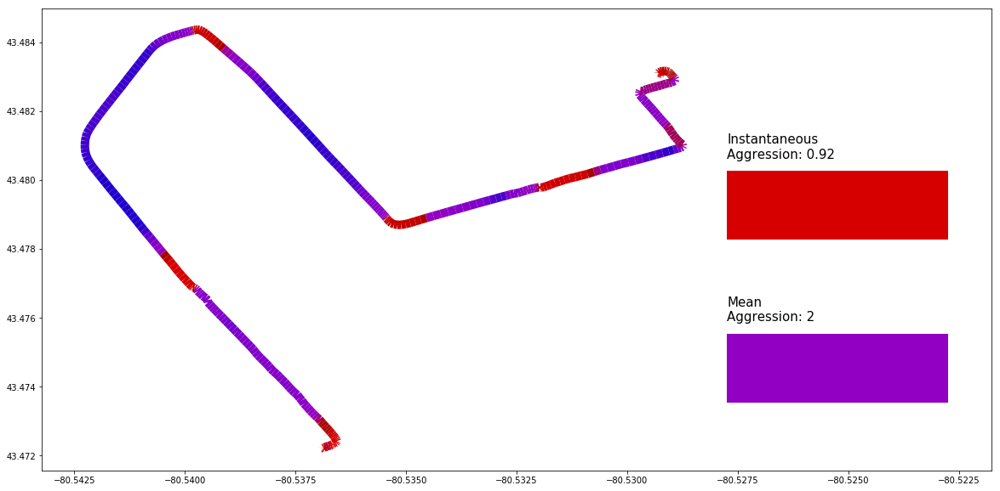

In [29]:
cdict = {'red':   [(0.0,  0.0, 0.0),
                   (0.45,  0.0, 0.0),
                   (0.5,  0.5, 0.5),
#                    (0.5,  0.0, 0.0),
                   (1.0,  1.0, 1.0)],

         'green': [(0.0,  0.0, 0.0),
#                    (0.25, 0.0, 0.0),
#                    (0.75, 1.0, 1.0),
                   (1.0,  0.0, 0.0)],

         'blue':  [(0.0,  1.0, 1.0),
#                    (0.5,  1.0, 1.0),
#                    (0.75,  0.0, 0.0),
                   (0.6,  0.75, 0.75),
                   (0.65,  0.0, 0.0),
                   (1.0,  0.0, 0.0)]}

# cm = cpl.LinearSegmentedColormap.from_list("", ["blue","violet","red"])
cm = cpl.LinearSegmentedColormap("", cdict)
cNorm  = cpl.Normalize(vmin=0.5, vmax=3.75)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cm)

xy = [[xx, yy] for (xx,yy) in zip(df.longitude, df.latitude)] #(data.abs_x, data.abs_y)

xy = [ [x0, x1] for x0, x1 in zip(xy[:-1], xy[1:])]
cSegments = [scalarMap.to_rgba(c) for c in df.avgagg]
avg_agg_segments = [cpl.to_hex(scalarMap.to_rgba(c)) for c in df.agg_cumavg]
# ax.patches.Rectangle(
#         (0.72, 0.1), 0.2, 0.6,
#         facecolor="#00ffff"
#     ),

fig, ax = plt.subplots(figsize=(20, 10))
patch = patches.Rectangle(
        (longitude_max, (latitude_min*5+latitude_max) / 6),   # (x,y)
        0.005,          # width
        0.002,          # height
        facecolor=cpl.to_hex(scalarMap.to_rgba(agg_mean)),
    )
patch2 = patches.Rectangle(
        (longitude_max, (latitude_min+latitude_max) / 2),   # (x,y)
        0.005,          # width
        0.002,          # height
        facecolor=cpl.to_hex(scalarMap.to_rgba(df.iloc[0]['aggression'])),
    )
ax.add_patch(patch)
ax.add_patch(patch2)
ax.text(longitude_max, (latitude_min*2 + latitude_max)/3, 
        'Mean\nAggression: {}'.format(round(max(min(agg_mean / 3.5, 1) ,2), 0)), fontsize=15)

ax.text(longitude_max, (latitude_min + latitude_max*2)/3, 
        'Instantaneous\nAggression: {}'.format(round(max(min(df.iloc[0]['aggression'] / 3.5, 1) ,0), 2)), fontsize=15)
coll = LineCollection(xy,linewidth=10, color=cSegments)

ax.add_collection(coll)
ax.autoscale_view()

plt.show()
# print(avg_agg_segments)

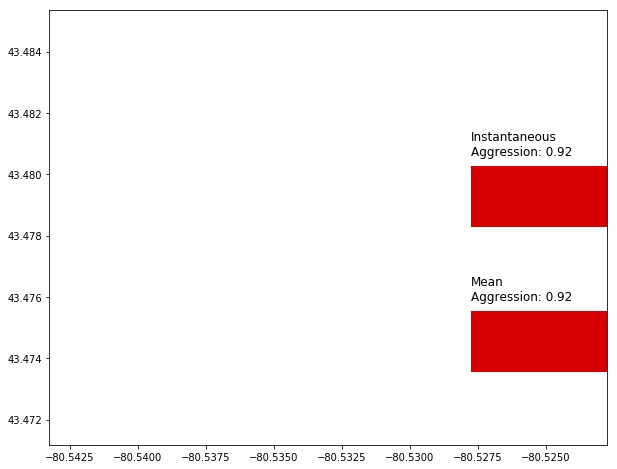

In [30]:
from matplotlib.text import Text
interval = 1
fig, ax = plt.subplots(figsize=(10, 8))
line = LineCollection(xy[:interval],linewidth=7, color=cSegments[:interval])
ax.add_collection(line)
ax.set(xlim=(longitude_min, longitude_max + 0.005), ylim=(latitude_min, latitude_max))
# ax.autoscale_view()
patch = patches.Rectangle(
        (longitude_max, (latitude_min+latitude_max) / 2),   # (x,y)
        0.005,          # width
        0.005,          # height
        facecolor=avg_agg_segments[0],
    )
ax.add_patch(patch)
# Text()
# ax.text(longitude_max, (latitude_min*2 + latitude_max)/3, 'Aggression', fontsize=10)
ax.text(longitude_max, (latitude_min*2 + latitude_max)/3, 
        'Mean\nAggression: {}'.format(round(max(min(agg_mean / 3.5, 1) ,2), 0)), fontsize=12)

ax.text(longitude_max, (latitude_min + latitude_max*2)/3, 
        'Instantaneous\nAggression: {}'.format(round(max(min(df.iloc[0]['aggression'] / 3.5, 1) ,2), 0)), fontsize=12)

def animate(i):
#     ax.clf()
#     ax.clear()
    for txt in ax.texts:
        txt.set_visible(False)
    for p in ax.patches:
        p.set_visible(False)
    line = LineCollection(xy[:interval*i], linewidth=7, color=cSegments[:interval*i])
    ax.add_collection(line)
#     patch.set_visible(False)
#     patch.set_visible(True)
#     patch.set_facecolor = avg_agg_segments[interval*i] 
#     ax.text.remove()
#     ax.add_patch(patch)
    ax.add_patch(patches.Rectangle(
        (longitude_max, (latitude_min+latitude_max) / 2),   # (x,y)
        0.005,          # width
        0.002,          # height
        facecolor=cpl.to_hex(scalarMap.to_rgba(df.iloc[interval*i]['aggression'])),
    ))
    ax.add_patch(patches.Rectangle(
        (longitude_max, (latitude_min*5+latitude_max) / 6),   # (x,y)
        0.005,          # width
        0.002,          # height
        facecolor=avg_agg_segments[interval*i],
    ))
#     ax.text(longitude_max, (latitude_min*2 + latitude_max)/3, 
#         'Average\nAggression: {}'.format(round(min(df.iloc[i*interval]['agg_cumavg'] / 3.5, 1) ,2)),
#         fontsize=10)
    ax.text(longitude_max, (latitude_min*2 + latitude_max)/3, 
        'Mean\nAggression: {}'.format(round(max(min(df.iloc[i*interval]['agg_cumavg'] / 3.5, 1) ,0), 2)), fontsize=12)

    ax.text(longitude_max, (latitude_min + latitude_max*2)/3, 
        'Instantaneous\nAggression: {}'.format(round(max(min(df.iloc[i*interval]['aggression'] / 3.5, 1) ,0), 2)), fontsize=12)


    
#     ax.autoscale_view()

anim = FuncAnimation(
    fig, animate, interval=20, frames=int(len(xy)/interval))#frames=50)#int(len(xy)/interval))
# plt.draw()
# plt.show()

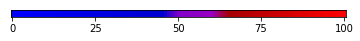

In [31]:
m = np.zeros((1,101))

for i in range(101):
    m[0,i] = (i)/100.0

plt.imshow(m, cmap=cm, aspect=2)
plt.yticks(np.arange(0))
plt.xticks(np.arange(0,101,25), [0,25,50,75,100])
plt.show()

In [32]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=FRAMERATE, metadata=dict(artist='Me'), bitrate=1800)
anim.save('animation.mp4', writer=writer)

In [9]:
# HTML(anim.to_jshtml())